
##Passo 1: Carregar as dependências

*   [Numpy](https://www.numpy.org/) é uma biblioteca para manipular matrizes/vetores.
*   [Pandas](https://pandas.pydata.org/) é uma biblioteca para manipular e analisar dados.
*   [CV2](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_gui/py_image_display/py_image_display.html) é uma biblioteca com diversas funcionalidades de visão computacional.
*   [Skimage](https://scikit-image.org/) é uma biblioteca que suporta aplicações de processamento de imagem em python.
*   [PIL](https://pypi.org/project/Pillow/) é uma biblioteca que adiciona suporte à abertura e gravação de muitos formatos de imagem diferentes.
*   [Matplotlib](https://matplotlib.org/) é uma biblioteca que gera figuras e gráficos.









In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow # para exibir imagens dentro do COLAB
from skimage import io
from PIL import Image
import matplotlib.pylab as plt

##Passo 2: filtros no domínio do espaço

Assim como os sinais unidimensionais, as imagens também podem ser filtradas com vários filtros passa-baixa, filtros passa-alta etc. Um filtro passa-baixa ajuda a remover ruídos ou borrar a imagem. Um filtro passa-alta ajuda a encontrar bordas em uma imagem.

O OpenCV fornece uma função, cv2.filter2D(), para convoluir um kernel com uma imagem.


##Passo 2a: filtros passa-baixa

Como exemplo, tentaremos um filtro de média em uma imagem. Um kernel de filtro de média 5x5 pode ser definido da seguinte forma:

A filtragem com o kernel abaixo resulta no seguinte: para cada pixel, uma janela de 5x5 é centralizada nesse pixel, todos os pixels que caem nessa janela são somados e o resultado é dividido por 25. Isso equivale a calcular a média dos valores de pixel dentro dessa janela. Esta operação é realizada para todos os pixels na imagem para produzir a imagem filtrada de saída. Tente este código e verifique o resultado:


Saving Lena_ruido.jpg to Lena_ruido (1).jpg
 original 


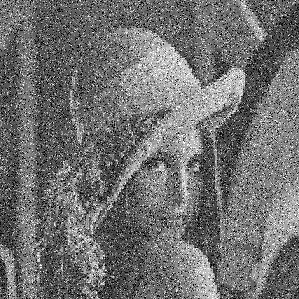

 filtro passa-baixa 5x5 


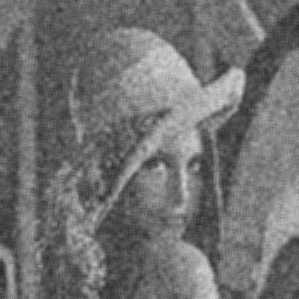

 filtro passa-baixa 5x5 - blur


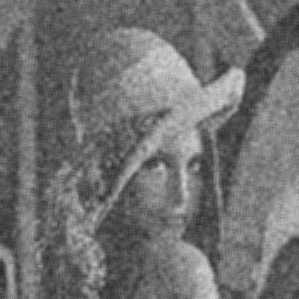

 filtro passa-baixa 5x5 - gaussiano


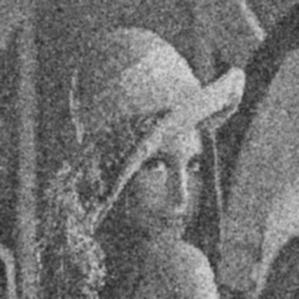

 filtro passa-baixa 5x5 - mediano


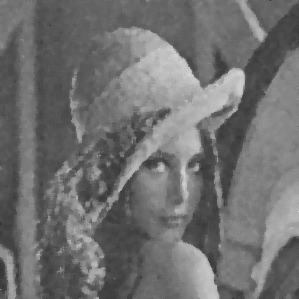

In [ ]:
# permite que seja utilizada imagens do computador. Faz o upload do arquivo do seu computador para a nuvem aqui do Colab
# caso estivesse programando numa IDE no seu computador ao invés do Colab, não precisaria deste comando, bastaria informar o diretório completo dentro do imread
from google.colab import files
uploaded = files.upload()

print('='*130 + '\n original \n' + '='*130)
img_input = cv.imread('Lena_ruido.jpg')               # ler uma imagem e converter pra matriz
img_input = cv.cvtColor(img_input, cv.COLOR_BGR2GRAY) # caso seja colorida (RGB), converter pra cinza (GRAY)
cv2_imshow(img_input)

print('='*130 + '\n filtro passa-baixa 5x5 \n' + '='*130)
kernel = np.ones((5,5),np.float32)/25         # criar uma máscara de 5x5 (média)
img_output = cv.filter2D(img_input,-1,kernel) # aplica a máscara na imagem por meio de janelamento
cv2_imshow(img_output)

print('='*130 + '\n filtro passa-baixa 5x5 - blur\n' + '='*130)
blur = cv.blur(img_input,(5,5))
cv2_imshow(blur)

print('='*130 + '\n filtro passa-baixa 5x5 - gaussiano\n' + '='*130)
gauss = cv.GaussianBlur(img_input,(5,5),0)
cv2_imshow(gauss)

print('='*130 + '\n filtro passa-baixa 5x5 - mediano\n' + '='*130)
median = cv.medianBlur(img_input,5)
cv2_imshow(median)

#### Aplicando o filtro passa-baixa

 original 


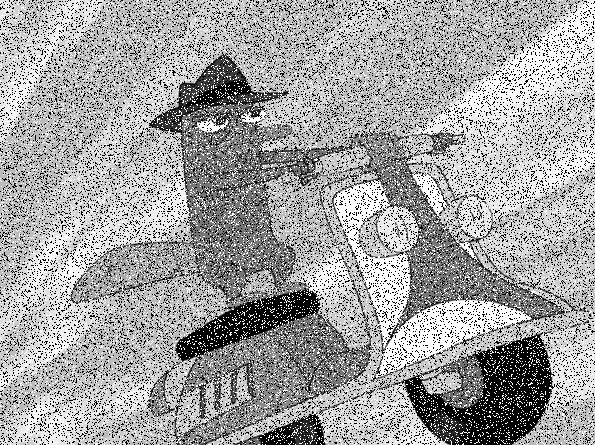

 filtro passa-baixa 5x5 


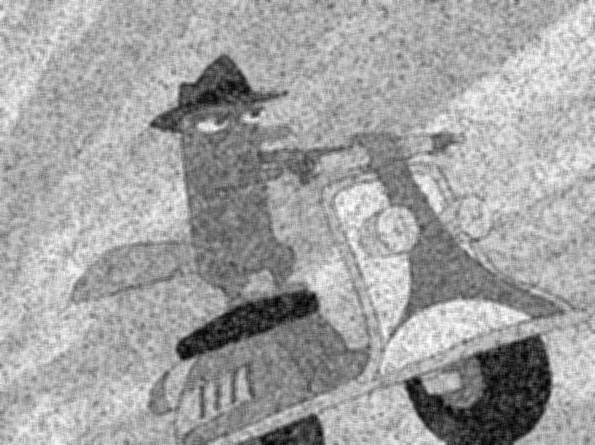

 filtro passa-baixa 5x5 - blur


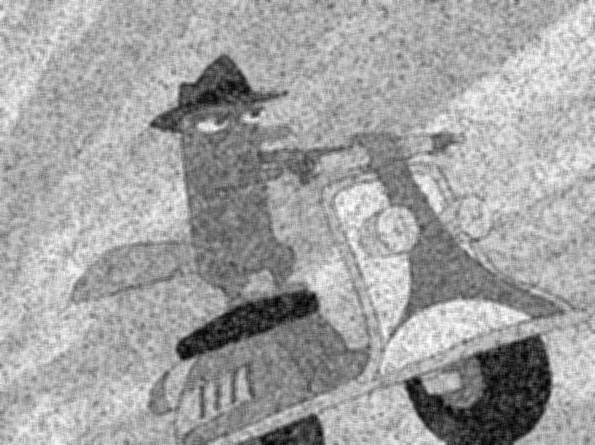

 filtro passa-baixa 5x5 - gaussiano


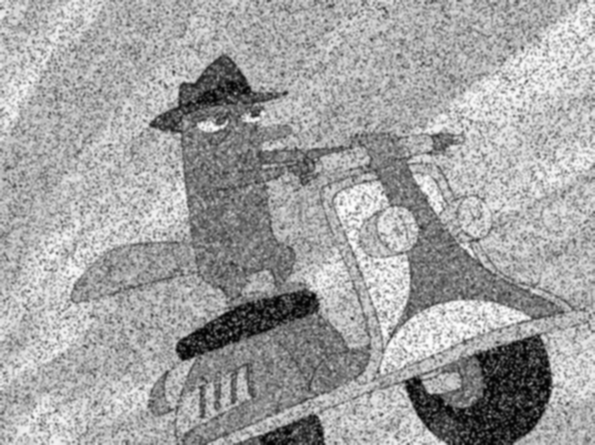

 filtro passa-baixa 5x5 - mediano


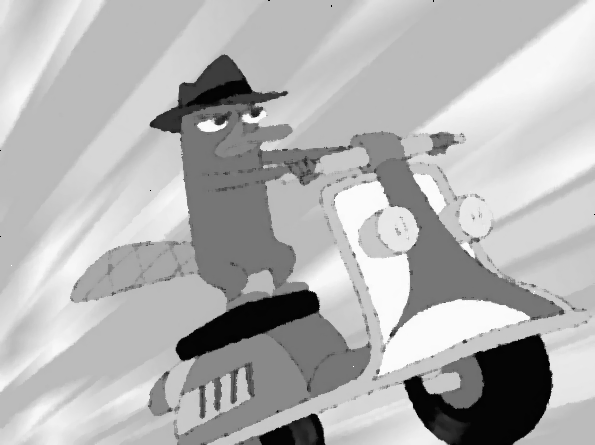

In [ ]:
print('='*130 + '\n original \n' + '='*130)
img_input = cv.imread('salt-perry.png')               # ler uma imagem e converter pra matriz
img_input = cv.cvtColor(img_input, cv.COLOR_BGR2GRAY) # caso seja colorida (RGB), converter pra cinza (GRAY)
cv2_imshow(img_input)

print('='*130 + '\n filtro passa-baixa 5x5 \n' + '='*130)
kernel = np.ones((5,5),np.float32)/25         # criar uma máscara de 5x5 (média)
img_output = cv.filter2D(img_input,-1,kernel) # aplica a máscara na imagem por meio de janelamento
cv2_imshow(img_output)

print('='*130 + '\n filtro passa-baixa 5x5 - blur\n' + '='*130)
blur = cv.blur(img_input,(5,5))
cv2_imshow(blur)

print('='*130 + '\n filtro passa-baixa 5x5 - gaussiano\n' + '='*130)
gauss = cv.GaussianBlur(img_input,(5,5),0)
cv2_imshow(gauss)

print('='*130 + '\n filtro passa-baixa 5x5 - mediano\n' + '='*130)
median = cv.medianBlur(img_input,5)
cv2_imshow(median)

## filtros passa-alta

Como exemplo, tentaremos um filtro de média em uma imagem. Um kernel de filtro de média 5x5 pode ser definido da seguinte forma:

A filtragem com o kernel abaixo resulta no seguinte: para cada pixel, uma janela de 5x5 é centralizada nesse pixel, todos os pixels que caem nessa janela são somados e o resultado é dividido por 25. Isso equivale a calcular a média dos valores de pixel dentro dessa janela. Esta operação é realizada para todos os pixels na imagem para produzir a imagem filtrada de saída. Tente este código e verifique o resultado:


Saving Moon.tif to Moon.tif
 original 


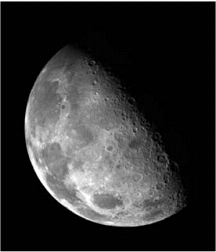

 filtro gradiente manual 


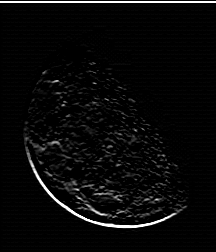

 filtro gradiente manual 


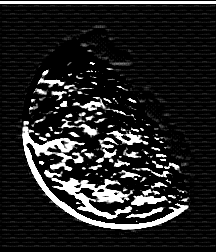

 filtro passa-alta 


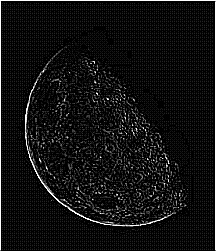

 filtro Laplaciano 


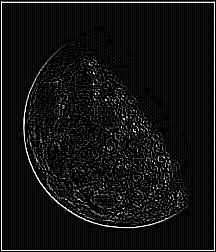

 filtros derivativos
original


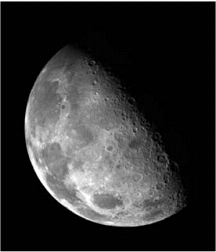

laplaciano


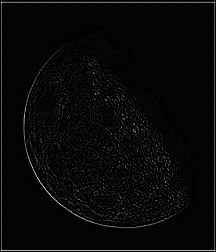

sobel em X


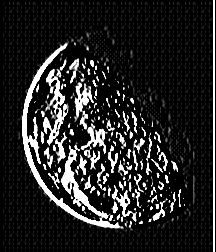

sobel em Y


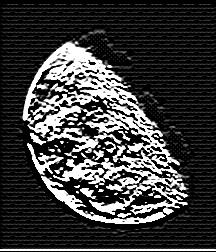

 filtro passa-alta - canny


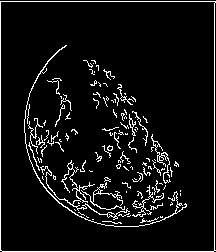

In [ ]:
# permite que seja utilizada imagens do computador. Faz o upload do arquivo do seu computador para a nuvem aqui do Colab
# caso estivesse programando numa IDE no seu computador ao invés do Colab, não precisaria deste comando, bastaria informar o diretório completo dentro do imread
#from google.colab import files
# uploaded = files.upload()

print('='*130 + '\n original \n' + '='*130)
img_input = cv.imread('Moon.tif')               # ler uma imagem e converter pra matriz
img_input = cv.cvtColor(img_input, cv.COLOR_BGR2GRAY) # caso seja colorida (RGB), converter pra cinza (GRAY)
cv2_imshow(img_input)

print('='*130 + '\n filtro gradiente manual \n' + '='*130)
kernel = np.array([                                   # criar um filtro manualmente pela matriz
                  [ 1,  1,  1],
                  [ 0,  0,  0],
                  [-1, -1, -1]
                  ], np.float32)
img_output = cv.filter2D(img_input,-1,kernel) # aplica a máscara na imagem por meio de janelamento
cv2_imshow(img_output)

print('='*130 + '\n filtro gradiente manual \n' + '='*130)
kernel = np.array([
                  [ 5,  5,  5,  5,  5],
                  [ 3,  3,  3,  3,  3],
                  [ 0,  0,  0,  0,  0],
                  [-3, -3, -3, -3, -3],
                  [-5, -5, -5, -5, -5]
                  ], np.float32)
img_output = cv.filter2D(img_input,-1,kernel) # aplica a máscara na imagem por meio de janelamento
cv2_imshow(img_output)

print('='*130 + '\n filtro passa-alta \n' + '='*130)
kernel = np.array([
                  [-1, -1, -1],
                  [-1,  8, -1],
                  [-1, -1, -1]
                  ], np.float32)
img_output = cv.filter2D(img_input,-1,kernel) # aplica a máscara na imagem por meio de janelamento
cv2_imshow(img_output)

print('='*130 + '\n filtro Laplaciano \n' + '='*130)
kernel = np.array([
                  [1,  1, 1],
                  [1, -8, 1],
                  [1,  1, 1]
                  ], np.float32)
img_output = cv.filter2D(img_input,-1,kernel) # aplica a máscara na imagem por meio de janelamento
cv2_imshow(img_output)



print('='*130 + '\n filtros derivativos\n' + '='*130)
img_input = cv.imread('Moon.tif')               # ler uma imagem e converter pra matriz
img_input = cv.cvtColor(img_input, cv.COLOR_BGR2GRAY) # caso seja colorida (RGB), converter pra cinza (GRAY)
laplacian = cv.Laplacian(img_input,cv.CV_64F)
sobelx = cv.Sobel(img_input,cv.CV_64F,1,0,ksize=5)
sobely = cv.Sobel(img_input,cv.CV_64F,0,1,ksize=5)
print('original')
cv2_imshow(img_input)   # original
print('laplaciano')
cv2_imshow(laplacian)   # laplaciano
print('sobel em X')
cv2_imshow(sobelx)      # derivativo em X
print('sobel em Y')
cv2_imshow(sobely)      # derivativo em Y

print('='*130 + '\n filtro passa-alta - canny\n' + '='*130)
edges = cv.Canny(img_input,100,200)
cv2_imshow(edges)


#### Aplicar o filtro passa-alta

 original 


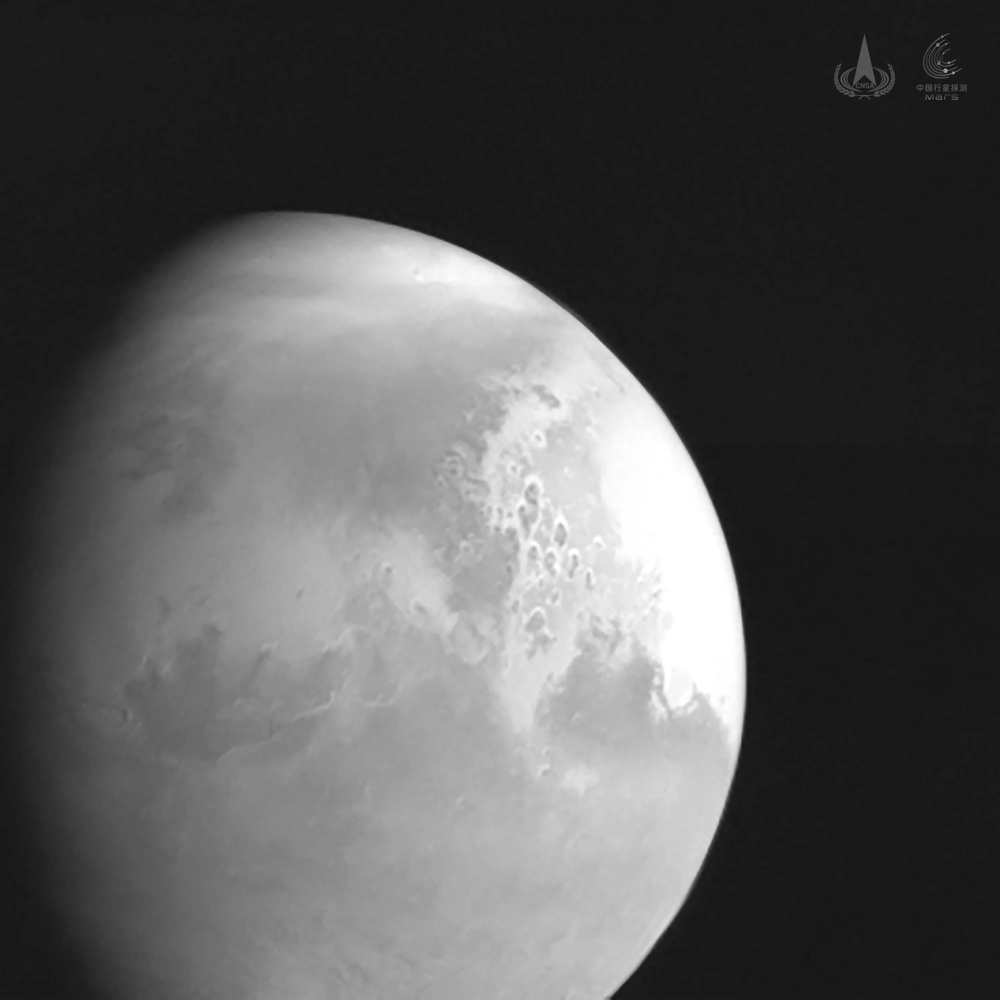

 filtro gradiente manual 


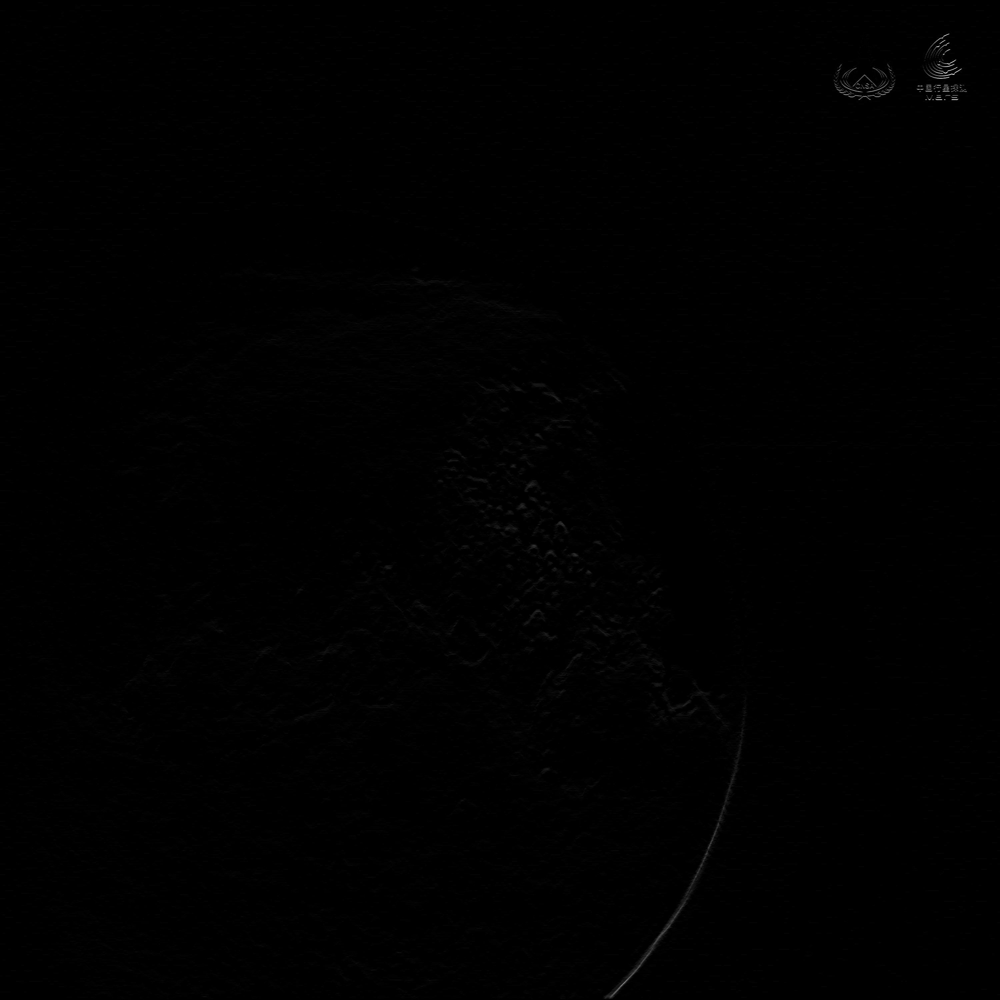

 filtro gradiente manual 


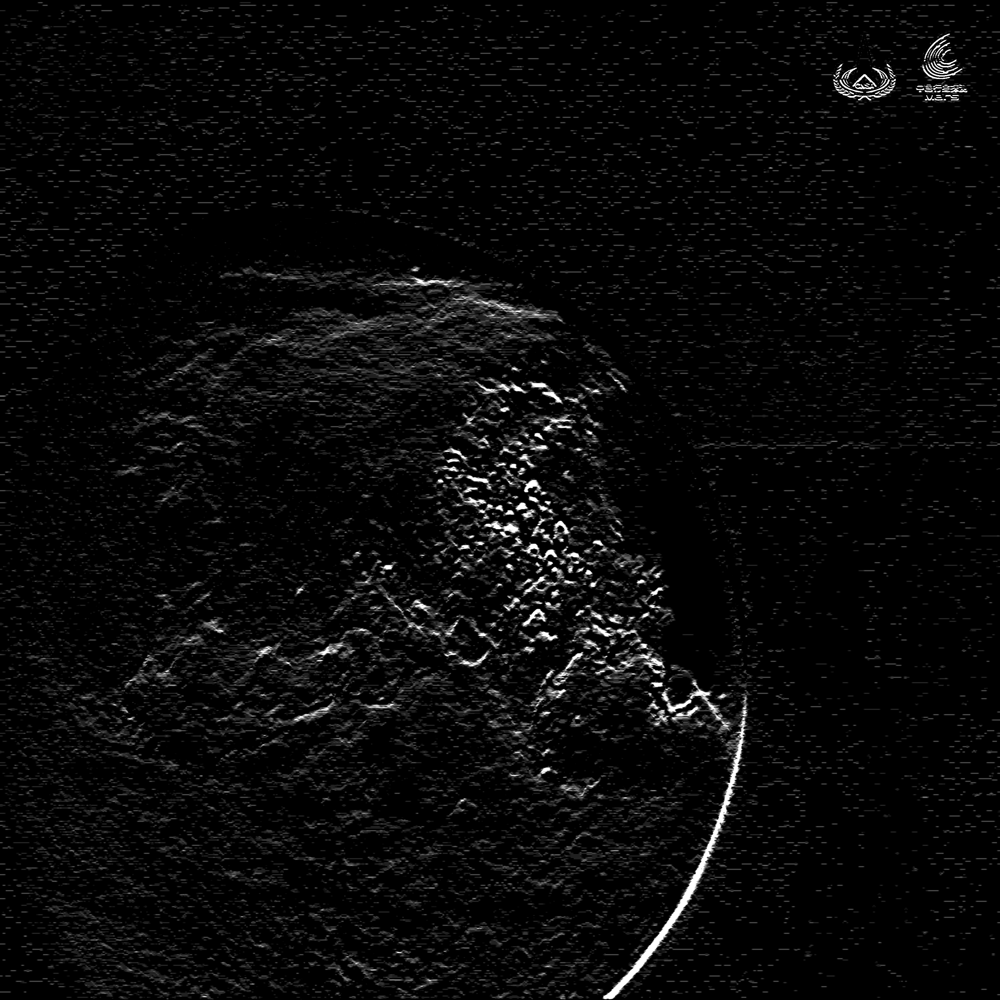

 filtro passa-alta 


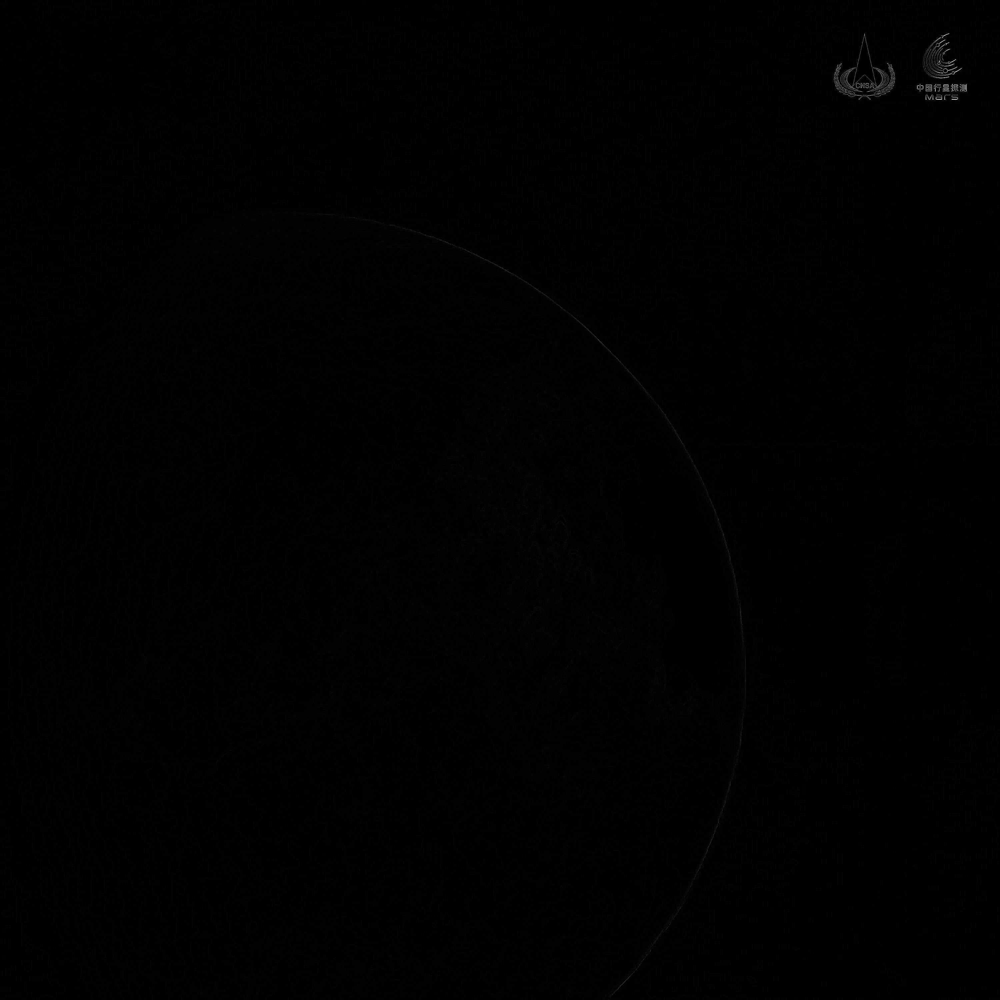

 filtro Laplaciano 


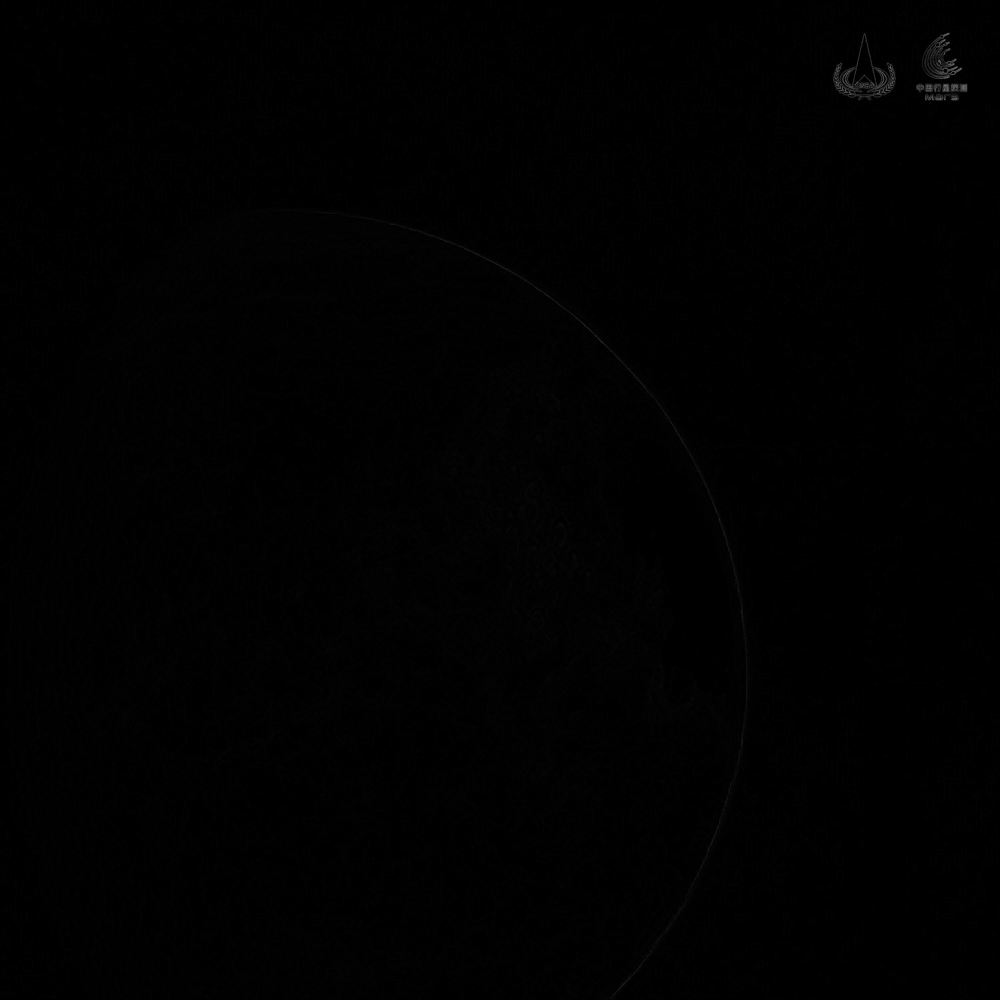

 filtros derivativos
original


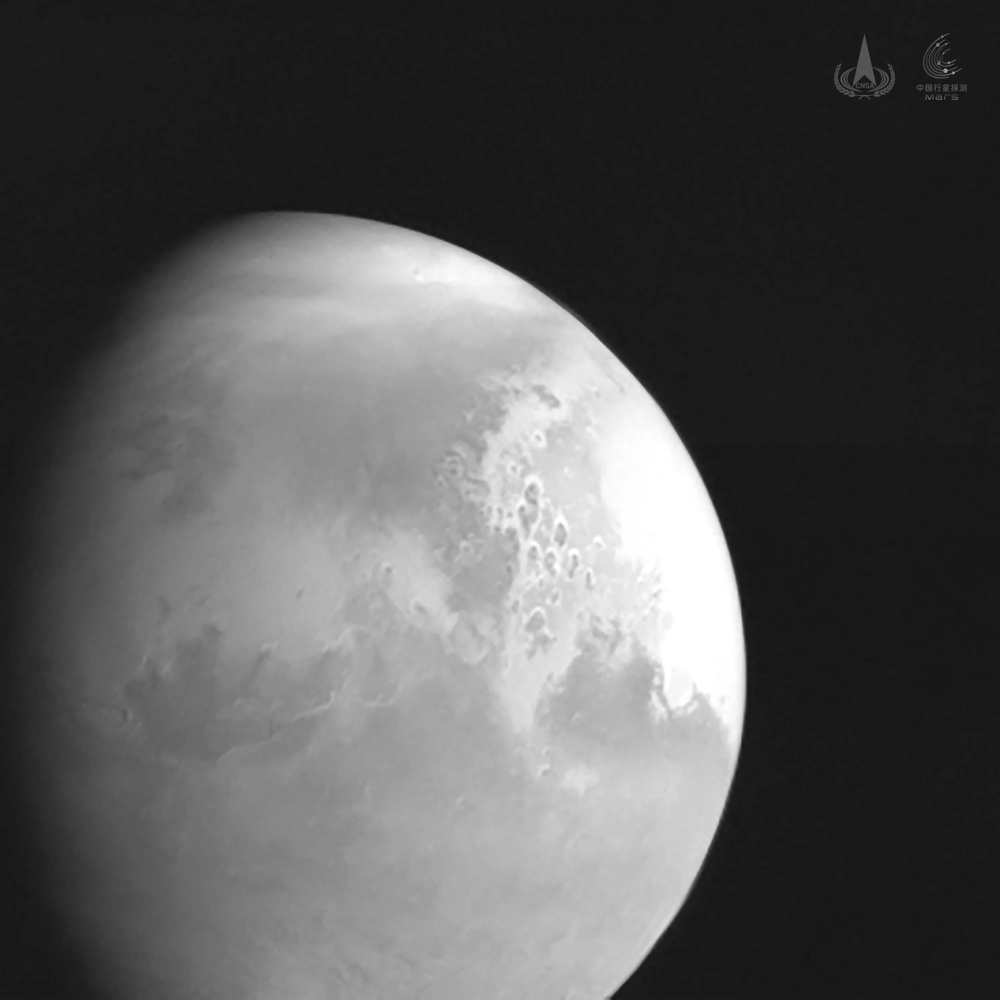

laplaciano


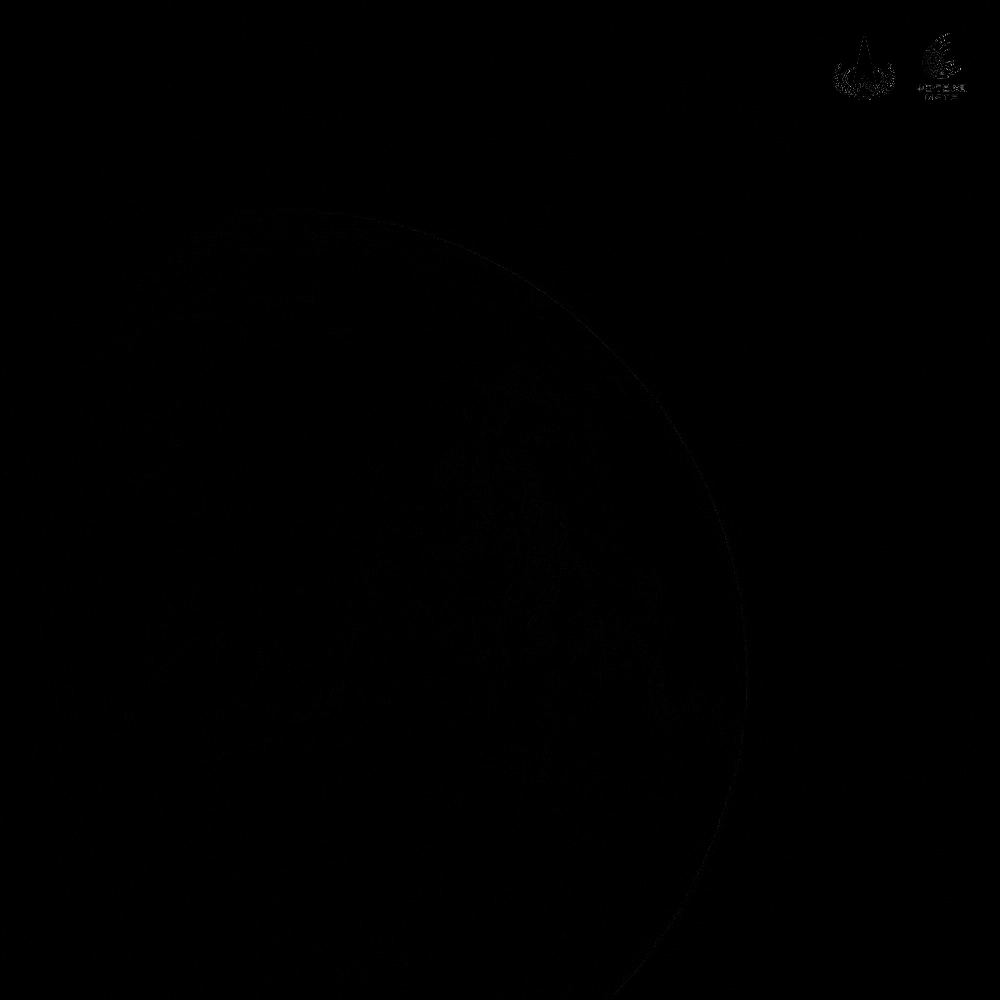

sobel em X


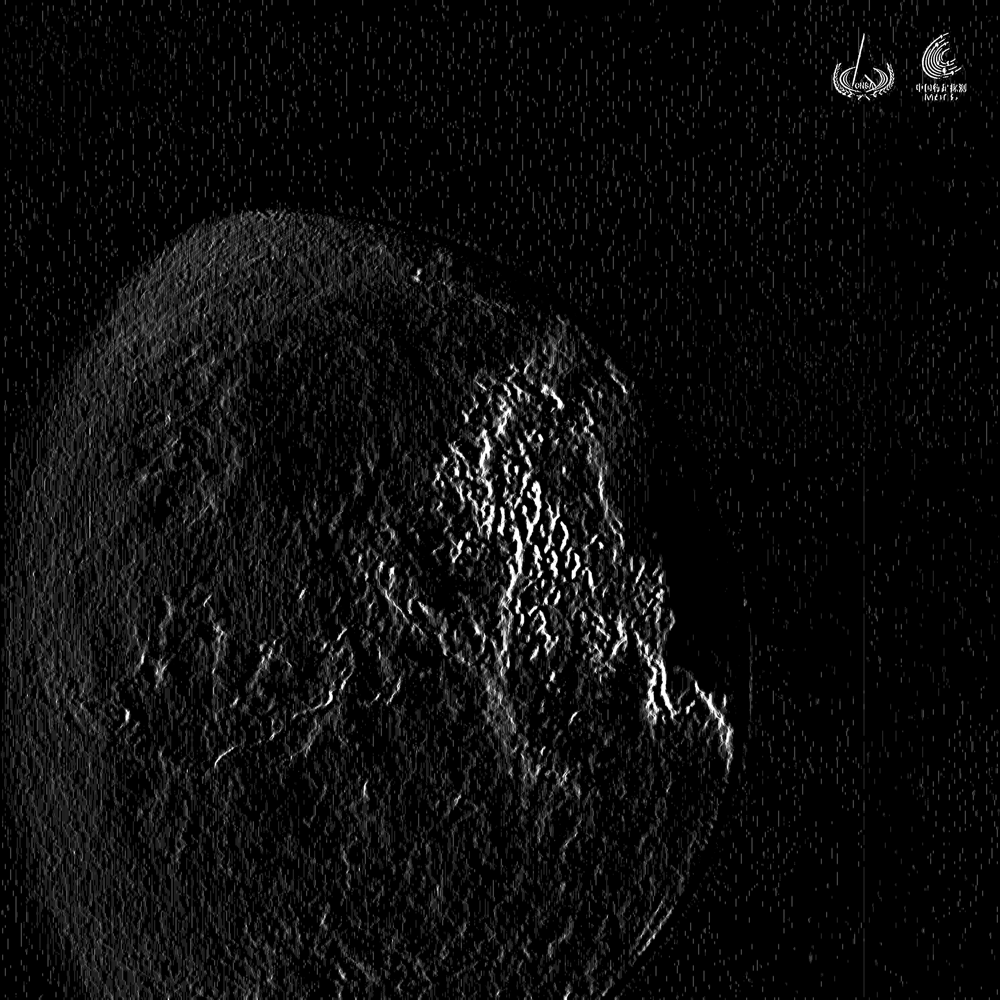

sobel em Y


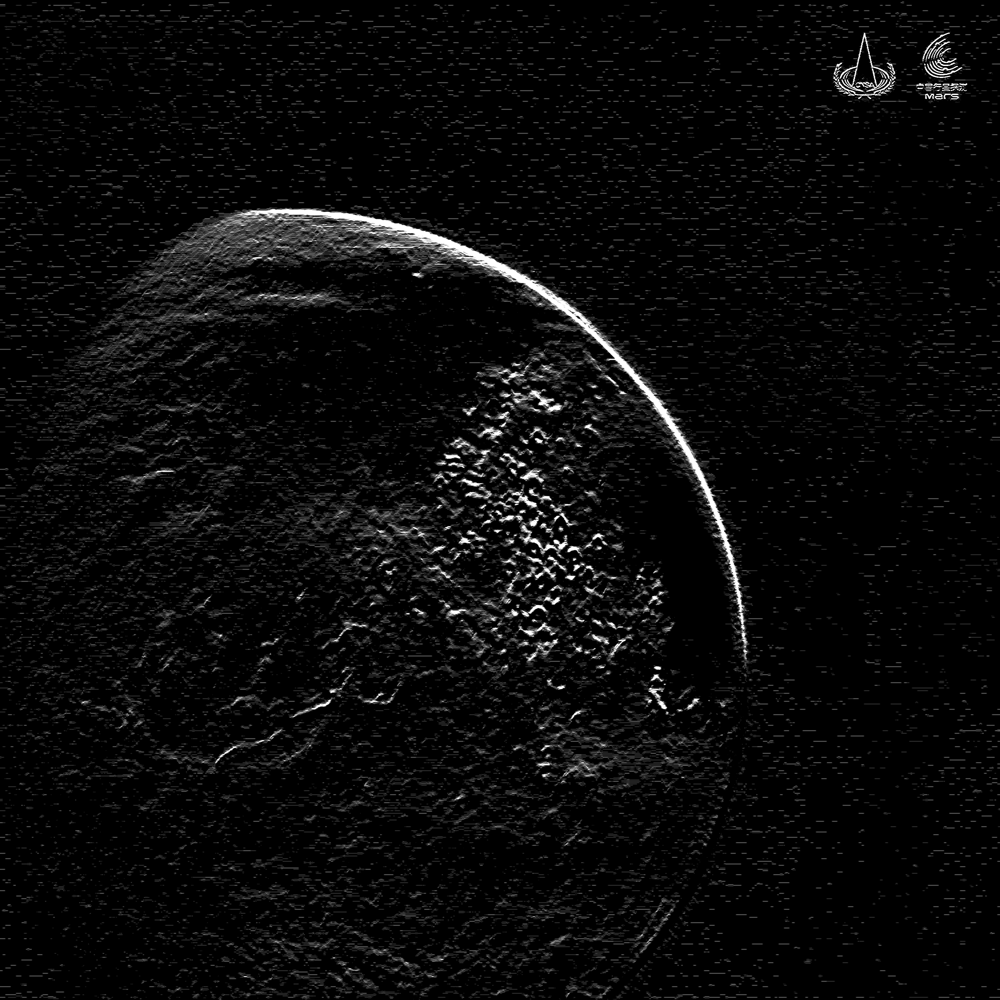

 filtro passa-alta - canny


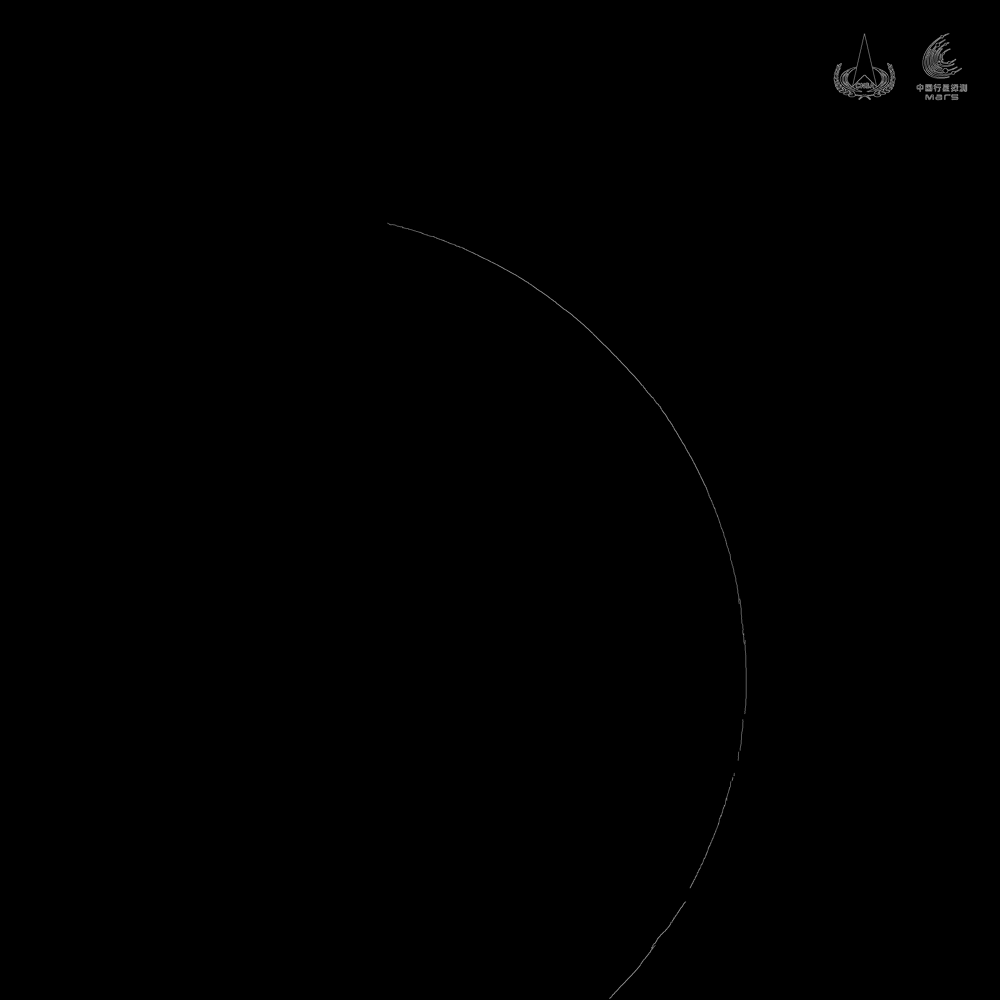

In [ ]:
print('='*130 + '\n original \n' + '='*130)
img_input = cv.imread('marte.webp')               # ler uma imagem e converter pra matriz
img_input = cv.cvtColor(img_input, cv.COLOR_BGR2GRAY) # caso seja colorida (RGB), converter pra cinza (GRAY)
cv2_imshow(img_input)

print('='*130 + '\n filtro gradiente manual \n' + '='*130)
kernel = np.array([                                   # criar um filtro manualmente pela matriz
                  [ 1,  1,  1],
                  [ 0,  0,  0],
                  [-1, -1, -1]
                  ], np.float32)
img_output = cv.filter2D(img_input,-1,kernel) # aplica a máscara na imagem por meio de janelamento
cv2_imshow(img_output)

print('='*130 + '\n filtro gradiente manual \n' + '='*130)
kernel = np.array([
                  [ 5,  5,  5,  5,  5],
                  [ 3,  3,  3,  3,  3],
                  [ 0,  0,  0,  0,  0],
                  [-3, -3, -3, -3, -3],
                  [-5, -5, -5, -5, -5]
                  ], np.float32)
img_output = cv.filter2D(img_input,-1,kernel) # aplica a máscara na imagem por meio de janelamento
cv2_imshow(img_output)

print('='*130 + '\n filtro passa-alta \n' + '='*130)
kernel = np.array([
                  [-1, -1, -1],
                  [-1,  8, -1],
                  [-1, -1, -1]
                  ], np.float32)
img_output = cv.filter2D(img_input,-1,kernel) # aplica a máscara na imagem por meio de janelamento
cv2_imshow(img_output)

print('='*130 + '\n filtro Laplaciano \n' + '='*130)
kernel = np.array([
                  [1,  1, 1],
                  [1, -8, 1],
                  [1,  1, 1]
                  ], np.float32)
img_output = cv.filter2D(img_input,-1,kernel) # aplica a máscara na imagem por meio de janelamento
cv2_imshow(img_output)



print('='*130 + '\n filtros derivativos\n' + '='*130)
img_input = cv.imread('marte.webp')               # ler uma imagem e converter pra matriz
img_input = cv.cvtColor(img_input, cv.COLOR_BGR2GRAY) # caso seja colorida (RGB), converter pra cinza (GRAY)
laplacian = cv.Laplacian(img_input,cv.CV_64F)
sobelx = cv.Sobel(img_input,cv.CV_64F,1,0,ksize=5)
sobely = cv.Sobel(img_input,cv.CV_64F,0,1,ksize=5)
print('original')
cv2_imshow(img_input)   # original
print('laplaciano')
cv2_imshow(laplacian)   # laplaciano
print('sobel em X')
cv2_imshow(sobelx)      # derivativo em X
print('sobel em Y')
cv2_imshow(sobely)      # derivativo em Y

print('='*130 + '\n filtro passa-alta - canny\n' + '='*130)
edges = cv.Canny(img_input,100,200)
cv2_imshow(edges)